# Import Library

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import ticker
from sklearn.tree import DecisionTreeRegressor

# Read CSV

In [2]:
df = pd.read_csv('df_hourly.csv')

In [3]:
df.head()

,timestamp,usage,cost,DAY OR NIGHT,MONTH,YEAR,DAY,SEASON,IS WEEKDAY,IS HOLIDAY
0,2016-10-22 00:00:00,0.04,0.0,0,10,2016,22,2,0,0
1,2016-10-22 01:00:00,0.04,0.0,0,10,2016,22,2,0,0
2,2016-10-22 02:00:00,0.08,0.0,0,10,2016,22,2,0,0
3,2016-10-22 03:00:00,0.04,0.0,0,10,2016,22,2,0,0
4,2016-10-22 04:00:00,0.04,0.0,0,10,2016,22,2,0,0


In [4]:
df.shape

(17592, 10)

## Drop SEASON column
If we know what month it is, we will also know what season it is. But if we only know what season it is, we don't know what month it is.

In [5]:
df = df.drop('SEASON', axis = 1)

In [6]:
df.columns

Index(['timestamp', 'usage', 'cost', 'DAY OR NIGHT', 'MONTH', 'YEAR', 'DAY',
       'IS WEEKDAY', 'IS HOLIDAY'],
      dtype='object')

# Data Splitting

In [7]:
split_point = int(len(df) * 0.8)  # for an 80%/20% train/test split
df_train = df.iloc[:split_point]
df_test = df.iloc[split_point:]

In [8]:
df_train.shape

(14073, 9)

In [9]:
df_test.shape

(3519, 9)

# Plot Data

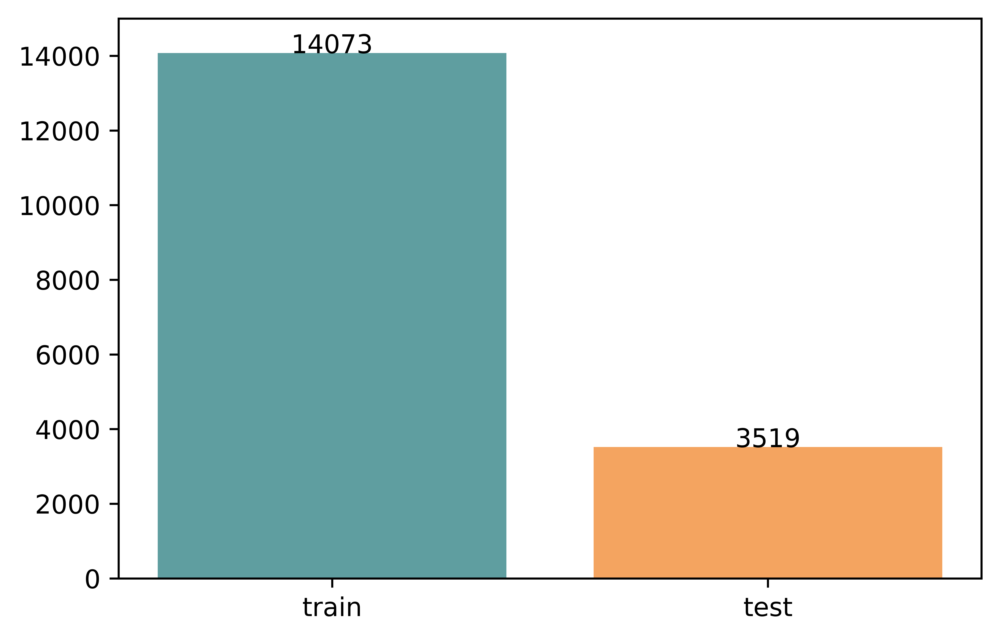

In [10]:
# Values to be plotted
values = [df_train.shape[0], df_test.shape[0]]
labels = ['train', 'test']

# Create barplot
plt.bar(labels, values, color=['cadetblue', 'sandybrown'])
plt.gcf().set_dpi(1000)
plt.ylim(0, 15000)

# Annotate bars with the value above them
for i, value in enumerate(values):
    plt.text(i, value, str(value), ha='center')

# Show plot
plt.show()


# Set timestamp as index

In [11]:
df_train = df_train.set_index('timestamp')
df_train

,usage,cost,DAY OR NIGHT,MONTH,YEAR,DAY,IS WEEKDAY,IS HOLIDAY
timestamp,,,,,,,,
2016-10-22 00:00:00,0.04,0.00,0,10,2016,22,0,0
2016-10-22 01:00:00,0.04,0.00,0,10,2016,22,0,0
2016-10-22 02:00:00,0.08,0.00,0,10,2016,22,0,0
2016-10-22 03:00:00,0.04,0.00,0,10,2016,22,0,0
2016-10-22 04:00:00,0.04,0.00,0,10,2016,22,0,0
...,...,...,...,...,...,...,...,...
2018-05-31 04:00:00,0.16,0.04,0,5,2018,31,1,0
2018-05-31 05:00:00,0.20,0.04,0,5,2018,31,1,0
2018-05-31 06:00:00,0.16,0.04,1,5,2018,31,1,0


In [12]:
df_test = df_test.set_index('timestamp')
df_test

,usage,cost,DAY OR NIGHT,MONTH,YEAR,DAY,IS WEEKDAY,IS HOLIDAY
timestamp,,,,,,,,
2018-05-31 09:00:00,0.28,0.04,1,5,2018,31,1,0
2018-05-31 10:00:00,0.24,0.04,1,5,2018,31,1,0
2018-05-31 11:00:00,0.32,0.08,1,5,2018,31,1,0
2018-05-31 12:00:00,0.28,0.08,1,5,2018,31,1,0
2018-05-31 13:00:00,0.28,0.08,1,5,2018,31,1,0
...,...,...,...,...,...,...,...,...
2018-10-24 19:00:00,0.12,0.04,0,10,2018,24,1,0
2018-10-24 20:00:00,0.12,0.04,0,10,2018,24,1,0
2018-10-24 21:00:00,0.12,0.04,0,10,2018,24,1,0


# Data Description

In [13]:
df_train.describe()

,usage,cost,DAY OR NIGHT,MONTH,YEAR,DAY,IS WEEKDAY,IS HOLIDAY
count,14073.000000,14073.000000,14073.000000,14073.000000,14073.000000,14073.000000,14073.000000,14073.000000
mean,0.513127,0.102457,0.499893,6.200597,2017.135366,15.866340,0.713494,0.034108
std,0.915873,0.184973,0.500018,3.715611,0.599361,8.821124,0.452145,0.181513
min,0.000000,0.000000,0.000000,1.000000,2016.000000,1.000000,0.000000,0.000000
25%,0.120000,0.040000,0.000000,3.000000,2017.000000,8.000000,0.000000,0.000000
50%,0.200000,0.040000,0.000000,5.000000,2017.000000,16.000000,1.000000,0.000000
75%,0.480000,0.080000,1.000000,10.000000,2018.000000,24.000000,1.000000,0.000000
max,9.440000,2.520000,1.000000,12.000000,2018.000000,31.000000,1.000000,1.000000


# Get X (features) and y (predicted)

In [14]:
X_train = df_train.drop(['usage'],axis=1)
y_train = pd.DataFrame(df_train['usage'])
X_test = df_test.drop(['usage'],axis=1)
y_test = pd.DataFrame(df_test['usage'])

In [15]:
X_train

,cost,DAY OR NIGHT,MONTH,YEAR,DAY,IS WEEKDAY,IS HOLIDAY
timestamp,,,,,,,
2016-10-22 00:00:00,0.00,0,10,2016,22,0,0
2016-10-22 01:00:00,0.00,0,10,2016,22,0,0
2016-10-22 02:00:00,0.00,0,10,2016,22,0,0
2016-10-22 03:00:00,0.00,0,10,2016,22,0,0
2016-10-22 04:00:00,0.00,0,10,2016,22,0,0
...,...,...,...,...,...,...,...
2018-05-31 04:00:00,0.04,0,5,2018,31,1,0
2018-05-31 05:00:00,0.04,0,5,2018,31,1,0
2018-05-31 06:00:00,0.04,1,5,2018,31,1,0


In [16]:
y_train

,usage
timestamp,
2016-10-22 00:00:00,0.04
2016-10-22 01:00:00,0.04
2016-10-22 02:00:00,0.08
2016-10-22 03:00:00,0.04
2016-10-22 04:00:00,0.04
...,...
2018-05-31 04:00:00,0.16
2018-05-31 05:00:00,0.20
2018-05-31 06:00:00,0.16


In [17]:
X_test

,cost,DAY OR NIGHT,MONTH,YEAR,DAY,IS WEEKDAY,IS HOLIDAY
timestamp,,,,,,,
2018-05-31 09:00:00,0.04,1,5,2018,31,1,0
2018-05-31 10:00:00,0.04,1,5,2018,31,1,0
2018-05-31 11:00:00,0.08,1,5,2018,31,1,0
2018-05-31 12:00:00,0.08,1,5,2018,31,1,0
2018-05-31 13:00:00,0.08,1,5,2018,31,1,0
...,...,...,...,...,...,...,...
2018-10-24 19:00:00,0.04,0,10,2018,24,1,0
2018-10-24 20:00:00,0.04,0,10,2018,24,1,0
2018-10-24 21:00:00,0.04,0,10,2018,24,1,0


In [18]:
y_test

,usage
timestamp,
2018-05-31 09:00:00,0.28
2018-05-31 10:00:00,0.24
2018-05-31 11:00:00,0.32
2018-05-31 12:00:00,0.28
2018-05-31 13:00:00,0.28
...,...
2018-10-24 19:00:00,0.12
2018-10-24 20:00:00,0.12
2018-10-24 21:00:00,0.12


# Experiment 1: Baseline (using default parameters)

In [19]:
from sklearn.tree import DecisionTreeRegressor, plot_tree

regressor = DecisionTreeRegressor(random_state=42)
regressor.fit(X_train, y_train)
y = regressor.predict(X_test)

In [20]:
print(regressor.get_params())

{'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 42, 'splitter': 'best'}


In [21]:
plt.figure(figsize=(15, 10))
plt.gcf().set_dpi(1000)
plot_tree(regressor, filled=True, feature_names=X_train.columns, rounded=True, fontsize=10)
plt.show()

## Feature Importance

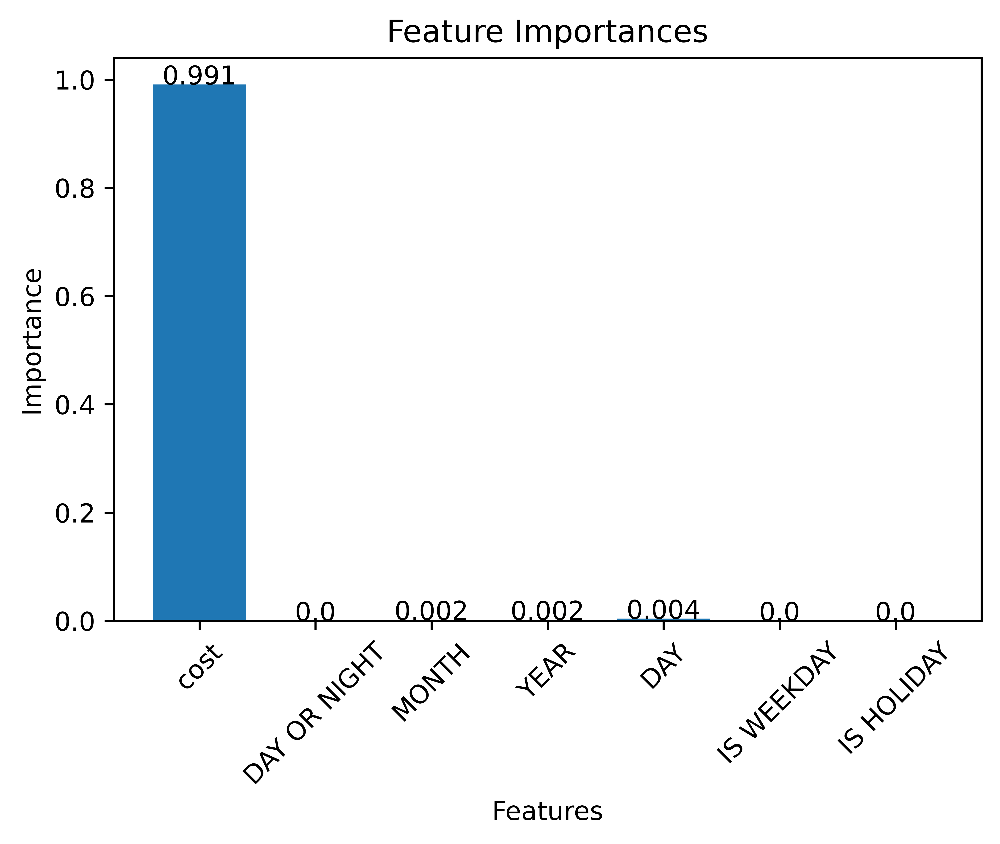

In [22]:
feature_importances = regressor.feature_importances_

# Plot feature importances
fi = [round(x, 3) for x in feature_importances]
plt.bar(range(len(fi)), fi, tick_label=X_train.columns)
plt.gcf().set_dpi(1000)
for i, value in enumerate(fi):
    plt.text(i, value, str(value), ha='center')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.xticks(rotation=45)
plt.show()

## Predicted

In [23]:
y

array([0.16      , 0.16      , 0.4       , ..., 0.23428571, 0.08      ,
       0.23428571])

See the value counts of y

In [24]:
from collections import Counter
Counter(y)

Counter({0.16: 156,
         0.4: 119,
         0.84: 31,
         0.19333333333333333: 26,
         0.504: 5,
         1.64: 9,
         5.08: 1,
         0.12: 90,
         0.165: 65,
         0.68: 27,
         0.5733333333333334: 22,
         1.08: 33,
         0.44: 39,
         3.12: 1,
         1.44: 29,
         0.06: 22,
         0.15000000000000002: 29,
         0.06285714285714286: 14,
         1.32: 19,
         2.56: 4,
         0.8: 25,
         0.32: 108,
         1.2: 18,
         0.56: 44,
         2.36: 4,
         2.12: 9,
         1.96: 26,
         0.72: 29,
         0.19999999999999998: 61,
         0.08: 128,
         0.94: 2,
         0.33999999999999997: 45,
         0.14222222222222222: 17,
         0.48: 46,
         0.07: 11,
         0.19333333333333336: 36,
         0.064: 3,
         0.36000000000000004: 19,
         0.5800000000000001: 25,
         0.14666666666666664: 41,
         0.0: 1,
         0.42000000000000004: 14,
         0.14285714285714285: 2

## Evaluation

In [25]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import accuracy_score
from math import sqrt

mse = mean_squared_error(y_test, y)
rmse = sqrt(mse)
mae = mean_absolute_error(y_test, y)
print(f"MSE : {mse}\nRMSE: {rmse}\nMAE : {mae}")

MSE : 0.006250013852975864
RMSE: 0.07905702911807314
MAE : 0.05395433857923202


## Plotting actual vs predicted

In [26]:
y_test = y_test.sort_index()  # Make sure the index is sorted
y_df = pd.DataFrame({'usage': y}, index=y_test.index)
y_df

,usage
timestamp,
2018-05-31 09:00:00,0.160000
2018-05-31 10:00:00,0.160000
2018-05-31 11:00:00,0.400000
2018-05-31 12:00:00,0.400000
2018-05-31 13:00:00,0.400000
...,...
2018-10-24 19:00:00,0.234286
2018-10-24 20:00:00,0.234286
2018-10-24 21:00:00,0.234286


In [27]:
plt.figure(figsize=(20, 8))
plt.gcf().set_dpi(1000)
plt.plot(y_test.index, y_test['usage'], label='Actual', color='blue')
plt.plot(y_test.index, y_df['usage'], label='Predicted', linestyle='dashed', color='orange')
plt.xlabel('Timestamp')
plt.ylabel('Electricity Usage')
plt.title('Actual vs. Predicted Electricity Usage')
plt.xticks(y_df.index[::100], rotation=45, ha='right')
plt.legend()
plt.show()

In [28]:
y_test

,usage
timestamp,
2018-05-31 09:00:00,0.28
2018-05-31 10:00:00,0.24
2018-05-31 11:00:00,0.32
2018-05-31 12:00:00,0.28
2018-05-31 13:00:00,0.28
...,...
2018-10-24 19:00:00,0.12
2018-10-24 20:00:00,0.12
2018-10-24 21:00:00,0.12


# Prediction 2: Parameter Tuning

In [29]:
from sklearn.model_selection import GridSearchCV

param_grid = {'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
              "splitter":["best","random"],
              "max_depth" : [1,3,5,7,9,None],
              "min_samples_leaf":[1,3,5,7,9],
              "min_weight_fraction_leaf":[0.0,0.1,0.2,0.3],
              'max_leaf_nodes': [3, 5, 7, 9]
} 
  
grid = GridSearchCV(regressor, param_grid, cv=None, scoring = 'neg_mean_squared_error')

grid.fit(X_train, y_train)
y_pred_grid = grid.predict(X_test)

In [30]:
print(grid.best_params_)

{'criterion': 'squared_error', 'max_depth': 5, 'max_leaf_nodes': 9, 'min_samples_leaf': 1, 'min_weight_fraction_leaf': 0.0, 'splitter': 'best'}


In [31]:
print(grid.best_score_)

-0.023476637328869294


## Prediction Result

In [32]:
y_pred_grid

array([0.14049372, 0.14049372, 0.44031759, ..., 0.14049372, 0.14049372,
       0.14049372])

## Evaluation

In [33]:
print('After Parameter Tuning')
mse_grid = mean_squared_error(y_test, y_pred_grid)
rmse_grid = sqrt(mse_grid)
mae_grid = mean_absolute_error(y_test, y_pred_grid)
print(f"MSE : {mse_grid}\nRMSE: {rmse_grid}\nMAE : {mae_grid}")

After Parameter Tuning
MSE : 0.013923727676834013
RMSE: 0.11799884608263767
MAE : 0.08593108541460066


## Plot actual vs Predicted

In [34]:
y_test = y_test.sort_index()  # Make sure the index is sorted
y_df = pd.DataFrame({'usage': y_pred_grid}, index=y_test.index)
y_df

,usage
timestamp,
2018-05-31 09:00:00,0.140494
2018-05-31 10:00:00,0.140494
2018-05-31 11:00:00,0.440318
2018-05-31 12:00:00,0.440318
2018-05-31 13:00:00,0.440318
...,...
2018-10-24 19:00:00,0.140494
2018-10-24 20:00:00,0.140494
2018-10-24 21:00:00,0.140494


In [35]:
plt.figure(figsize=(20, 8))
plt.gcf().set_dpi(1000)
plt.plot(y_test.index, y_test['usage'], label='Actual', color='blue')
plt.plot(y_test.index, y_df['usage'], label='Predicted', linestyle='dashed', color='orange')
plt.xlabel('Timestamp')
plt.ylabel('Electricity Usage')
plt.title('Actual vs. Predicted Electricity Usage')
plt.xticks(y_df.index[::100], rotation=45, ha='right')
plt.legend()
plt.show()

# Experiment 3: Take few for examples (to be presented)

## Take 2 columns only

In [36]:
df_train2 = df_train.copy()
df_test2 = df_test.copy()

X_train2 = df_train2[['IS WEEKDAY','IS HOLIDAY']]
y_train2 = df_train2['usage']

X_test2 = df_test2[['IS WEEKDAY','IS HOLIDAY']]
y_test2 = df_test2['usage']

## Prediction

In [37]:
from sklearn.tree import DecisionTreeRegressor, plot_tree

regressor2 = DecisionTreeRegressor()
regressor2.fit(X_train2, y_train2)
y2 = regressor2.predict(X_test2)

In [38]:
print(regressor2.get_params())

{'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': None, 'splitter': 'best'}


In [39]:
print(regressor2)

DecisionTreeRegressor()


## Tree

In [40]:
plt.figure(figsize=(15, 10))
plt.gcf().set_dpi(1000)
plot_tree(regressor2, filled=True, feature_names=X_train2.columns, rounded=True, fontsize=10)
plt.show()

## RMSE

In [41]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from math import sqrt

rmse = sqrt(mean_squared_error(y_test2, y2))
# acc = accuracy_score(y_test, y)
rmse

0.4378171265396202

## Custom input

In [42]:
x_test_input = pd.DataFrame({'timestamp':['2018-10-25 00:00:00'],'IS WEEKDAY':[1],'IS HOLIDAY':[1]})
x_test_input['timestamp'] = pd.to_datetime(x_test_input['timestamp'])
x_test_input = x_test_input.set_index('timestamp')
x_test_input

,IS WEEKDAY,IS HOLIDAY
timestamp,,
2018-10-25,1,1


In [43]:
regressor2.predict(x_test_input)

array([0.76421569])